<a href="https://colab.research.google.com/github/jupyter-papers/FerroicsBuildingBlocks/blob/master/FerroicsBuildingBlocks_jupyter_paper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine learning analysis of the atomic-scale ferroelectric distortions 

Authors: TBA

Affiliations: TBA

*This is an interactive paper meaning that you can run the code yourself to reproduce all the results. The code will be intermixed with the usual paper's text and figures (the code sections should appear hidden by default).*

# Abstract

Recent advances in scanning transmission electron microscopy (STEM) have enabled direct visualization of the atomic structure of ferroic materials, enabling the determination of atomic column positions with ~pm precision. This in turn enabled direct mapping of ferroelectric and ferroelastic order parameter fields via the top-down approach, where the atomic coordinates are directly mapped on the mesoscopic order parameters. Here, we explore the alternative bottom-up approach, where the atomic coordinates derived from the STEM image are used to explore the extant atomic displacement patterns in the material and build the collection of the building blocks for the distorted lattice. This approach is illustrated for the La-doped BiFeO$_3$ films. 

### Import/install python modules (code)

This should not take more than several minutes.

We first download files specific to this analysis (e.g. experimental data, neural network skeleton, etc.):

In [0]:
%%capture
!git clone https://github.com/jupyter-papers/FerroicsBuildingBlocks.git
!git clone https://github.com/jupyter-papers/util.git

We will need to install a PyTorch deep learning library ( ~1-2 minutes) and then check if PyTorch sees Google Colab's GPU device:

In [0]:
!pip3 install https://download.pytorch.org/whl/cu90/torch-1.0.0-cp36-cp36m-linux_x86_64.whl
!python util/devices.py

Available GPU device: Tesla K80


Here we install necessary packages for model vizualization (~30 seconds):

In [0]:
%%capture
!pip install -q pydot && apt-get install graphviz -y
!pip install git+https://github.com/szagoruyko/pytorchviz

Next we download training data (~1-2 minutes):

(notice that we also provide a pre-trained model, so in principle you can skip all the step associated with model training)

In [0]:
training_data_url =  !cat FerroicsBuildingBlocks/training_data
training_data_url = training_data_url[0]
!gdown $training_data_url

Downloading...
From: https://drive.google.com/uc?id=1iC0TxvPlHWVLm8GJ9u5F6L6FiBWswItZ
To: /content/BFO-ts0-512.hdf5
4.56GB [00:46, 98.1MB/s]


Finally, we import all necessary python modules:

In [0]:
# I/O, data manipulation and plotting
import os
from google.colab import files
import time
import numpy as np
from sklearn.utils import shuffle
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [0]:
# neural networks
import torch
from FerroicsBuildingBlocks import dcnn
from FerroicsBuildingBlocks.utils import *
# vizualization tools for neural networks
import pydot
from torchviz import make_dot

In [0]:
# clustering/unmixing and dimensionality reduction
import scipy.spatial as spatial
from sklearn import mixture
from sklearn import decomposition
from sklearn import manifold

# Introduction
After more than 70 years of intensive research, ferroelectrics remain one of the most fascinating materials classes. This is both due to a broad spectrum of applications ranging from non-volatile electronic to electromechanical and optoelectronic devices, and dazzling array of the physical phenomena and functionalities. The issues such as the nature of the morphotropic and relaxor states, ferroelectric and size effects, coupling between polarization and chemical, transport, and light phenomena have captured attention of scientific community worldwide
	Until recently, the insights into the fundamental physics of ferroelectric materials were derived using the synergy of macroscopic measurements and neutron and X-Ray scattering techniques. The invention of Piezoresponse Force Microscopy (PFM) and associated spectroscopic techniques have opened the realm of mesoscopic phenomena including polarization and domain wall dynamics, domain switching, and non-linear responses for exploration. The structural information on comparable length scales have become available via the focused X-Ray and tomographic techniques. However, the associated atomistic mechanisms have remained poorly understood until the list decade, when the spatial resolution and information limit in transmission and scanning transmission electron microscopy techniques (TEM and STEM) have allowed to map the structural distortions within the unit cells, and hence map mesoscopic ferroelectric order parameter field. 
	This approach was pioneered in TEM by Jia and in STEM by Chisholm and Borisevich, and further extended by Nelson, Mundi, Rossel, and others. Here, the atomic positions of cations and anions within a unit cell are used to derive the polarization, either directly as a weighted sum of the effective Born charges, or indirectly when a certain measure of unit cell asymmetry is assumed to be proportional to the polarization vector. Thus derived polarization fields can be used as a qualitative measure of materials functionality. Beyond the qualitative description, the polarization distributions in the vicinity of surfaces, interfaces, or topological defects can be directly matched to the solutions of the Ginzburg Landau equations to extract the magnitude of the gradient and gradient coupling terms such as flexoelectricity. 
	However, these analysis until now relied on the postulated relationship between experimentally determined atomic coordinates and the polarization vector. In more complex analyses, the bulk form of the Ginzburg Landau free energy was additionally adopted as available from macroscopic thermodynamic and scattering studies. However, in many materials systems such as morphotropic and relaxor ferroelectrics, the nature of the order parameter itself and hence corresponding free energy expansions are actively debated. Correspondingly, of interest is the question whether these descriptors can be obtained from the experimental data, as opposed to being postulated.
	Here we explore the nature of the building blocks in the morphotropic ferroelectric systems using the statistical analysis of the atomically-resolved STEM data. Using the deep-learning analysis, we identify the localization of atomic columns in the form of the probability density field. We further explore the use of several linear statistical unmixing techniques including Gaussian mixture models and independent component analysis to build the library of structural distortions and the associated domain structures. Further perspectives for the analysis are discussed.


# Results and Discussion

## Deep neural network-based analysis

As a first step of the analysis, we adopt the deep learning neural network analysis to convert noisy experimental data into atomic coordinates of different atomic species. We used a U-net-like fully convolutional neural network (FCNN) supplemented by the dilated convolutions in the bottleneck layer, which allows to perform the simultaneous mixed-scale de-noising of the atomic image and separation of atomic columns with different intensities into different “channels”/classes. The training set was generated for a regular square bipartite lattice without any specific knowledge of the particular system. The projection of atomic columns were represented as 2D gaussian blobs. This approach allows rapid identification of atomic positions based on local contrast. We notice that the same model can be also in principle used for the analysis of bipartite lattices in the surface scanning tunneling microscopy experiments. The output of the FCNN is a probability density field, where for each pixel the probability of belonging to a given type of atomic column is shown in Figure 1.


![Figure 1](https://github.com/jupyter-papers/FerroicsBuildingBlocks/raw/master/images/Fig1.png)
**Figure 1.** Experimental image of La-doped BiFeO$_3$ film. (b, c) Neural network output consisting of two channels corresponding to the different atomic sublattices.

### Neural network: training and inference on experimental data (code)

Here we initialize our neural network. It will have a contracting path consisting of regular convolutional operations followed by max-pooling operation, a bottleneck layer with three layers of atrous convolutions with different dilation rates, and an expanding path with bilinear upsampling that has the same convolutional blocks as the contracting path but in a reversed order. The skip connections provide a flow of information between contracting and expanding pathes.The final layer provides a pixel wise classifciation of the input data.

In [0]:
model = dcnn.atomsegnet(nb_classes = 3)

We can also visualize the model that we just constructed (entirely optional - feel free to skip this step and go directly to model compilation and training):

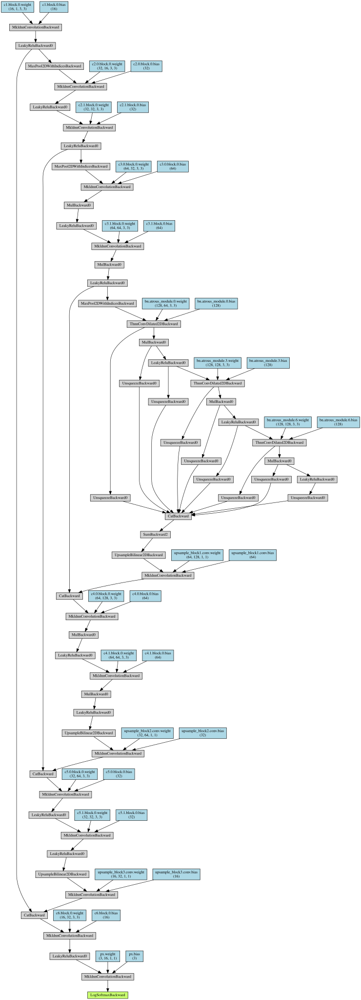

In [0]:
x = torch.randn(1, 1, 256, 256).requires_grad_(False)
y = model(x)
make_dot(y, params=dict(list(model.named_parameters()) + [('x', x)]))

Compile our model:

In [0]:
# Move the initialized model to GPU
model.cuda()

# specify loss function
criterion = torch.nn.NLLLoss()

# specify optimizer
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)

We are now going to train a model for cleaning image data and and idenifying different types of atoms in a square bipartite system. We specify a path/filename for the training set that we just downloaded and a batch size:

In [0]:
# Training data filepath:
hf_file = 'BFO-ts0-512.hdf5'
# batch size:
batch_size = 16

Here we demonstrate how a batch generator works. We initialize a batch generator and produce a batch of training images with corresponding ground truth:

In [0]:
gen = generate_batches(hf_file, batch_size)
train_imgs, gt = next(gen.batch(0))
gen.close_()

Plot a training image - ground truth pair:

(notice that this is a training set for two interlocked square lattices not specific to BFO )

Text(0.5, 1.0, 'Ground truth')

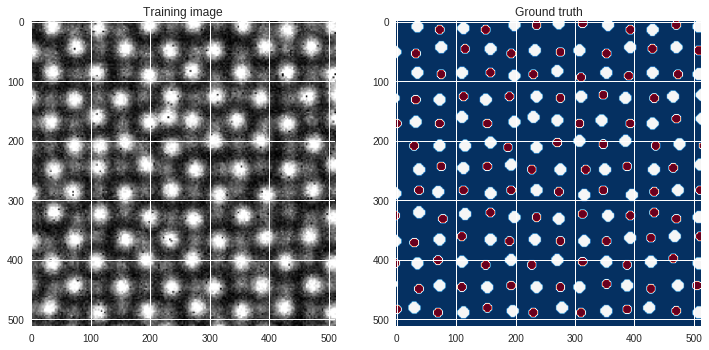

In [0]:
k = 6
fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(121)
ax1.imshow(train_imgs[k, 0, :, :], cmap = 'gray')
ax1.set_title('Training image')
ax2 = fig.add_subplot(122)
ax2.imshow(gt[k], cmap = 'RdBu', interpolation = 'Gaussian')
ax2.set_title('Ground truth')

Finally, we train our model.

*Notice that when we train a model using simulated data and later want to apply it to experimental data, the only validation that matters is model perfomance on experimental data afterwads*. I had  situations when a model performed very nicely on a simulated 'validation set' and then failed on real experimental data.

In [0]:
epochs = 64

train_losses, test_losses = [], []
# we will be randomly changing training images pixel size during model training
gen = generate_batches(hf_file, batch_size, (512-64, 512+64+1, 32))
steps = gen.steps()
steps_val = gen.steps(mode = 'val')

for e in range(epochs):
    # Train a model 
    print("\nEpoch {}/{}".format(e+1, epochs))   
    model.train()
    running_loss = 0
    start = time.time()
    steps = shuffle(steps)
    for i, s in enumerate(steps):
        print("\rTraining mode", 4*".",
              "Batch {}/{}".format(i+1, len(steps)),
              end = "")
        images, labels = next(gen.batch(s))
        images, labels = images.cuda(), labels.cuda() 
        optimizer.zero_grad() 
        log_prob = model.forward(images)
        loss = criterion(log_prob, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()      
        
    
    else: # Evaluate current state of your model on a validation set
        time_per_batch = (time.time()-start)/len(steps)
        model.eval()
        test_loss = 0
        accuracy = 0
        print()
        with torch.no_grad():
            for i, s in enumerate(steps_val):
                print("\rValidation mode", 4*".",
                      "Batch {}/{}".format(i+1, len(steps_val)),
                      end = "")
                images, labels = next(gen.batch(s, mode = 'val'))
                images, labels = images.cuda(), labels.cuda()
                log_prob = model.forward(images)
                test_loss += criterion(log_prob, labels) 
        train_losses.append(running_loss/len(steps))
        test_losses.append(test_loss/len(steps_val))
                
        print("\nTraining loss: {:.4f}".format(running_loss/len(steps)),
             8*".", "Test loss: {:.4f}".format(test_loss/len(steps_val)),
             8*".", "Time per batch: {:.2f} {}".format(time_per_batch, "s"))
         
    # save model weights if validation loss has decreased
    if e > 0 and test_losses[e] < min(test_losses[:e]):
        print("Saving checkpoint weights...")
        torch.save(model.state_dict(), 'atomfinder-' +
                   hf_file.split('.')[0] + '-3-best_weights.pt')
    if e == epochs-1:
        print('\nFinished model training')

torch.save(model.state_dict(), 'atomfinder-' + hf_file.split('.')[0] +'-3.pt')
gen.close_()

Plot test/train losses vs. epochs:

In [0]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(train_losses, '-o', label = 'Training loss')
ax.plot(test_losses, '-o', label = 'Test loss')
ax.set_title('Training history')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend(loc = 'upper right')
ax.grid(False)

Download weights to your local machine (and/or google drive if you are on ChromeOS):

In [0]:
from google.colab import files
best_weights = 'atomfinder-' + hf_file.split('.')[0] + '-3-best_weights.pt'
final_weights = 'atomfinder-' + hf_file.split('.')[0] +'-3.pt'
files.download(best_weights)
files.download(final_weights)

We will now use the trained network to make an inference on real experimental data. First we load the best weights from our network training into a model skeleton. Notice that we already provide the trained weights together with this notebook and therefore if you do not want to train a model, you can just load the saved weights by running the cell below. Alternatively, you may modify a filepath to load the weights of a model that you just trained (it is already there, you just need to uncomment the second line)

In [0]:
filepath = 'FerroicsBuildingBlocks/saved_models/atomfinder-BFO-ts0-512-3-best_weights.pt'
#filepath = 'atomfinder-BFO-ts0-512-3-best_weights.pt'
checkpoint = torch.load(filepath)
model = dcnn.atomsegnet(nb_classes = 3)
model.load_state_dict(checkpoint)

Set a directory for saving figures, which we can later download to a local machine.

In [0]:
mdirectory = 'Figures/'
if not os.path.exists(mdirectory):
    os.makedirs(mdirectory)  

Choose the experimental image to work with and load it into the notebook:

In [0]:
dirname = 'FerroicsBuildingBlocks/exp_data/'
image_filename = '22.06.02_2.npy'
STEM_real = np.load(dirname+image_filename)
STEM_real = torch_format(STEM_real)

Make a prediction (pixel-wise):

In [0]:
X_prob = predict(STEM_real, model, gpu = False)

Now plot results.

In [0]:
def christmasy(input_image,r1 = 1, r2 = 0.7, r3 = 0.01):
    '''Image beautification making it look
        christmasy (entirely optional)'''
    
    input_image_r = input_image[:,:,0]*r1
    input_image_g = input_image[:,:,1]*r2
    input_image_b = input_image[:,:,2]*r3
    input_image = torch.cat(
        (input_image_r[:,:,None], input_image_g[:,:,None],
         input_image_b[:,:,None]), dim = 2)
   
    return input_image

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


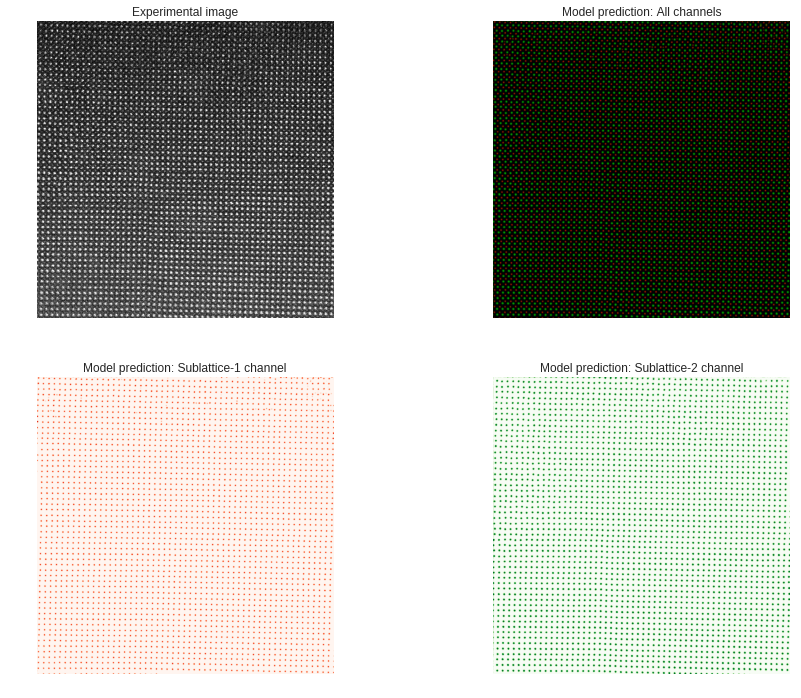

In [0]:
k = 0
X_prob_ = christmasy(X_prob[k])
fig = plt.figure(figsize = (15, 12))
ax1 = fig.add_subplot(221)
ax1.imshow(STEM_real[k, 0, :, :], cmap = 'gray')
ax1.set_title('Experimental image')
ax2 = fig.add_subplot(222)
ax2.imshow(X_prob_, Interpolation = 'Gaussian')
ax2.set_title('Model prediction: All channels')
ax3 = fig.add_subplot(223)
ax3.imshow(X_prob[k,:,:,0]>0.5, cmap = 'Reds', Interpolation = 'Gaussian')
ax3.set_title('Model prediction: Sublattice-1 channel')
ax3.grid('off')
ax4 = fig.add_subplot(224)
ax4.imshow(X_prob[k,:,:,1]>0.5, cmap = 'Greens', Interpolation = 'Gaussian')
ax4.set_title('Model prediction: Sublattice-2 channel')
ax4.grid('off')
for ax in [ax1, ax2, ax3, ax4]:
    ax.axis('off')
fig.savefig(mdirectory+str(image_filename[0:-4])+'-network_output.png')

We were able to distinguish between two types of sublattices, which were imaged in the experiment. Notice that here we analyzed image with resolution of 2048*x*2048 even though our network was trained only using 512*x*512 images. That's the beauty of fully convolutional neural network (i.e. network without full-connected, dense layers) - it is not sensitive to the size of input image as long as it can be divided by $2^{n}$ where *n* is a number of maxpooling layers in your network.

For future analysis, it will be convenient to work with numpy array instead of pytorch tensors:

In [0]:
network_output = X_prob.numpy()

## (Unsupervised) Ferroic building blocks extraction

To get fundamental insight into nature of the elementary building block in the material, we generate the local neighborhoods of side *d* for each site in the lattice, as shown in Fig. 2 (a). These sub-images are centered at the center of mass of each individual column, and hence are robust with respect to intrinsic factors such as large scale strains and distortions, and extrinsic factors such as microscope drift. On this stage, the image is transformed from 2D object to the set of subimages $c_n$, where $n = i,j$ defines the lattice site. The initial insight into information content in the system can be derived from the principal component analysis of the $c_n$, decomposing the feature vectors into the independent components. Shown in Fig. 2 (a) is the scree plot for the PCA decomposition for the several choices of the subimage size, which shows that, depending on the subimage size, the most of the information is contained in the first 3-5 components. The eigenmodes and their loading maps corresponding to the PCA decomposition of the local neighborhoods from the neural netowrk output are shown in Fig. 2(b-d) and 2(e-g), respectively.
![Figure 2](https://github.com/jupyter-papers/FerroicsBuildingBlocks/raw/master/images/Fig2.png)
**Figure 2.** (a) Principal component analysis (PCA) scree plot corresponding to different size of sub-images extracted from the neural network output (see the insets; “red” and “green” are the two sublattices, “blue” is a background class). Here is *d* is a side of a square submage defined as $2*(r + r_{blob}$) where r is the average distance between the nearest neighbor atomic columns in the two sublattices and $r_{blob}$  is the average radius of the larger blob (atomic column with a higher *Z* number). (b-g) PCA decomposition of the local image descriptors extracted from the neural network output into three components with the associated eigenmodes (a-c) and loading maps for each eigenmode (d-f).	

In the forthcoming discussion, we note that an important aspect of the adopted analysis is that it potentially allows for separation of the domain and orientation variants throughout the thickness of material. In other words, if random components are presented throughout the thickness of material with sufficient statistics, these can be separated. 

To separate the physical components, we use the linear unmixing with Gaussian mixture model (GMM). Here, ...

TBA

![Figure 3](https://github.com/jupyter-papers/FerroicsBuildingBlocks/raw/master/images/Fig3.png)
**Figure 3.** (a-c) The mean of each of the three mixture component in the Gaussian mixture model-based analysis of local image descriptors from the output of the neural network. (d) The corresponding spatial distribution of each component.

### Unmixing and dimensionality reduction analysis (code)

We will analyze the output of a neural network with tools such as principal components analysis (PCA), Gaussian mixture model (GMM) and independent component analysis (ICA). The goal is to map different classes of distortions (if present) using information on local neghborhood of atoms/blobs in the network output.

We define some helper functions:

In [0]:
def thresh_softmax(input_image, t = 0.5):
    '''Returns thresholded and non-thresholded
        numpy arrays for a given pytorch tensor'''
    
    _, thresh = cv2.threshold(input_image, t, 1, cv2.THRESH_BINARY)
    return thresh
    
    
def find_com(image_data):
    '''Returns center of the mass for all the blobs
       in each channel of network output'''
    
    lbls, nlbls = ndimage.label(image_data)
    com = np.array(ndimage.center_of_mass(image_data, lbls, np.arange(nlbls)+1))
    com = com.reshape(com.shape[0], 2)
    return com

Define a local neighborhood for the unmixing analysis:

In [0]:
k = 0 # image index in the image stack (in this case we have only one image)
sc = 1 # length of a "supercell"
com1 = find_com(thresh_softmax(network_output[k,:,:,0]))
com2 = find_com(thresh_softmax(network_output[k,:,:,1]))

d_ = []
for i, c in enumerate(com1):
    distance = spatial.KDTree(com2).query(c)[0]
    d_.append(distance)
    if i > 500:
        break

d_ = np.array(d_)
d_ = np.mean(d_) + np.std(d_)

thresh2 = cv2.convertScaleAbs(thresh_softmax(network_output[k,:,:,1]))
_, contours, _ = cv2.findContours(thresh2.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

ma_ = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 1:
        _, (m, M), _ = cv2.fitEllipse(cnt)
        ma_.append(m)
        if i > 500:
            break

ma_ = np.array(ma_)
ma_ = 2*(np.mean(ma_) + np.std(ma_))

d = np.around(d_ + ma_)
print('Effective radius of one cell:', int(d), 'px')
d = int(0.5*(sc+1)*d)
print('The subimages with side of', str(2*d), 'px will be extracted')

Effective radius of one cell: 32 px
The subimages with side of 64 px will be extracted


Extract the images stack (from the network output) corresponding to local neighborhoods of each atom/blob in one of the sublattices.

In [0]:
nb_classes = 3
img_cr_all = np.empty((0, int(d*2), int(d*2), nb_classes))
com_ = np.empty((0, 2))
for c in com1:
    cx = int(np.around(c[0]))
    cy = int(np.around(c[1]))
    img_cr = np.copy(network_output[0,cx-d:cx+d,cy-d:cy+d,:])
    if img_cr.shape == (int(d*2), int(d*2), nb_classes):
        img_cr_all = np.append(img_cr_all, [img_cr], axis = 0)
        com_ = np.append(com_, [c], axis = 0) 

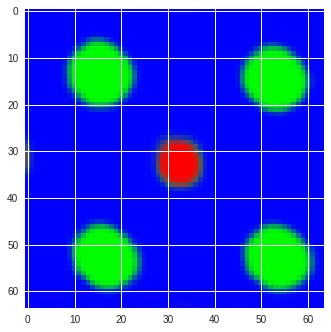

In [0]:
k = -1
plt.imshow(img_cr_all[k])

Flatten the image stack:

In [0]:
# We will remove a background channel
img_cr_all = img_cr_all[:,:,:,0:2]
# Flattern the image stack
n, w, h, ch = img_cr_all.shape
X_vec = img_cr_all.reshape(n, w*h*ch)

Perform PCA decompostion and plot explained variance as a function of the number of components:

In [0]:
pca = decomposition.PCA()
pca.fit(X_vec)
explained_var = pca.explained_variance_ratio_

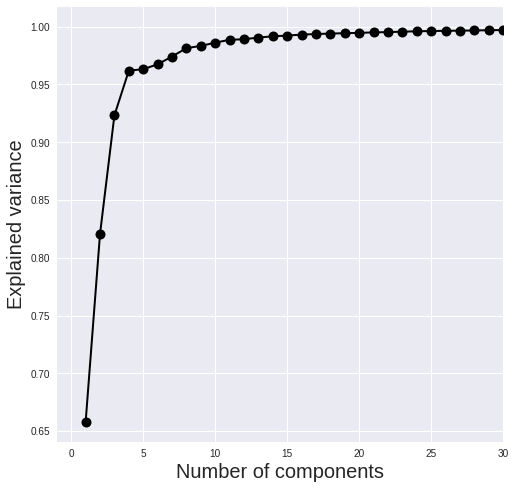

In [0]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(np.arange(1, len(explained_var)+1), 1 - explained_var,
         '-o', markersize = 10, color = 'black', linewidth=2)
ax.set_xlabel('Number of components', fontsize = 20)
ax.set_ylabel('Explained variance', fontsize = 20)
ax.set_xlim(-1, 30)
fig.savefig(mdirectory+str(image_filename[0:-4])+'-PCA-scree-n_cells-'+str(sc)+'.png')

I addition to PCA we can explore our dataset with a t-distributed Stochastic Neighbor Embedding (t-SNE):

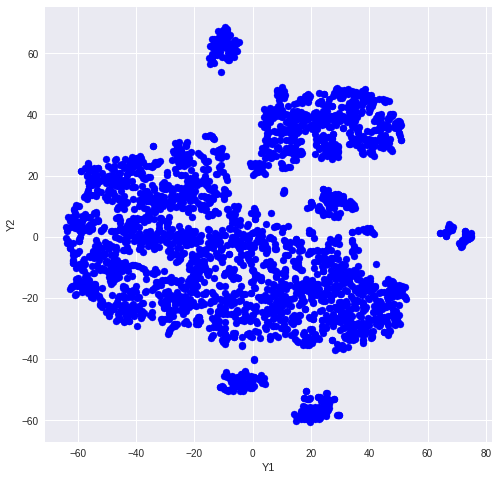

In [0]:
tsne = manifold.TSNE(n_components=2, init='pca', random_state=42)
Y = tsne.fit_transform(X_vec)
fig, ax = plt.subplots(1, 1, figsize = (8, 8))
ax.scatter(Y[:, 0], Y[:, 1], c = 'blue')
ax.set_xlabel('Y1')
ax.set_ylabel('Y2')
fig.savefig(mdirectory+str(image_filename[0:-4])+'-tSNE-n_cells-'+str(sc)+'.png')

We can plot PCA eigenmodes with the associated loading maps for different number of total PCA components:

NUMBER OF COMPONENTS: 3


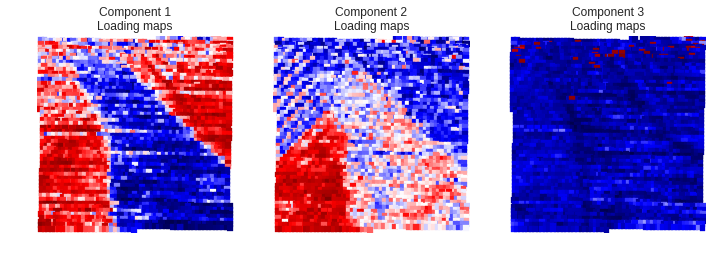

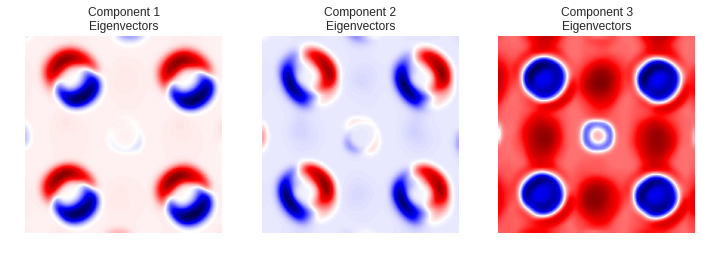

NUMBER OF COMPONENTS: 4


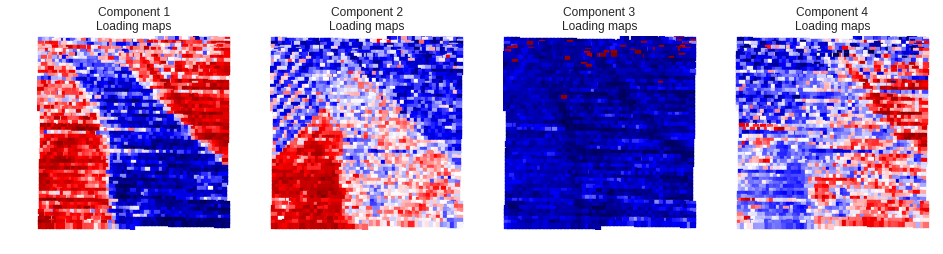

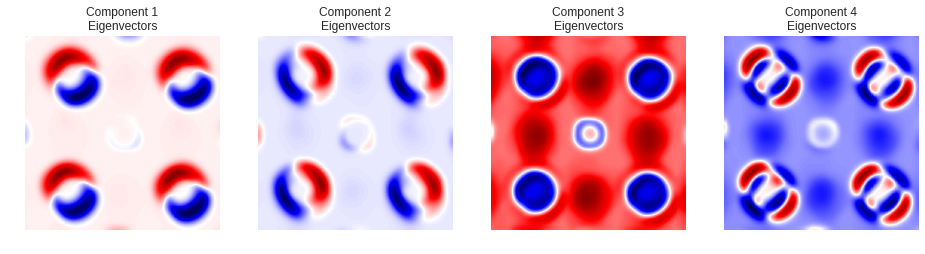

NUMBER OF COMPONENTS: 5


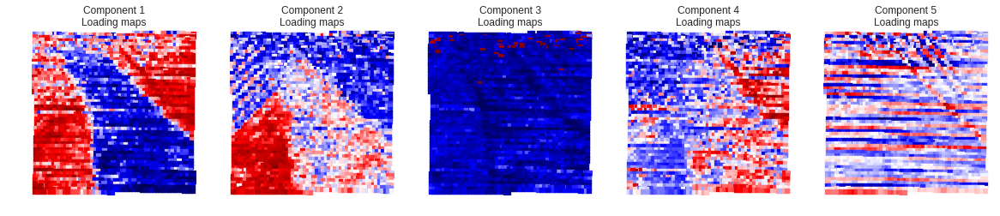

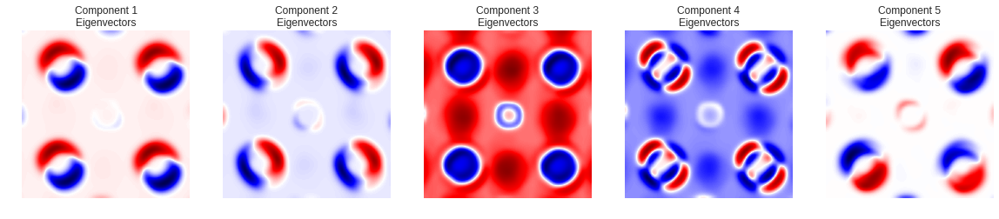

NUMBER OF COMPONENTS: 6


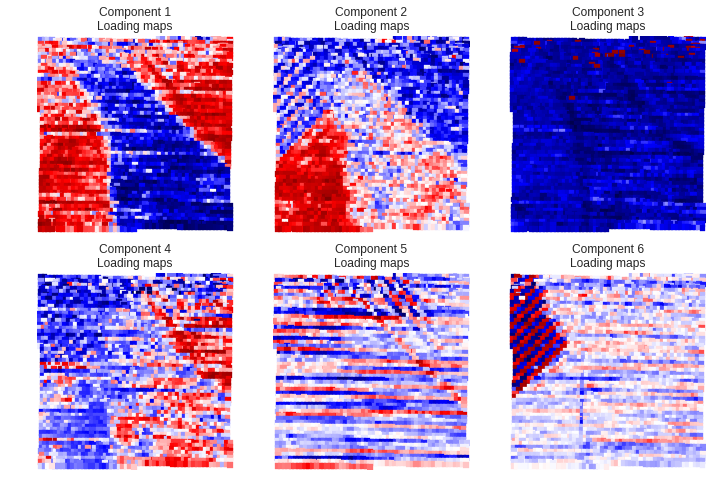

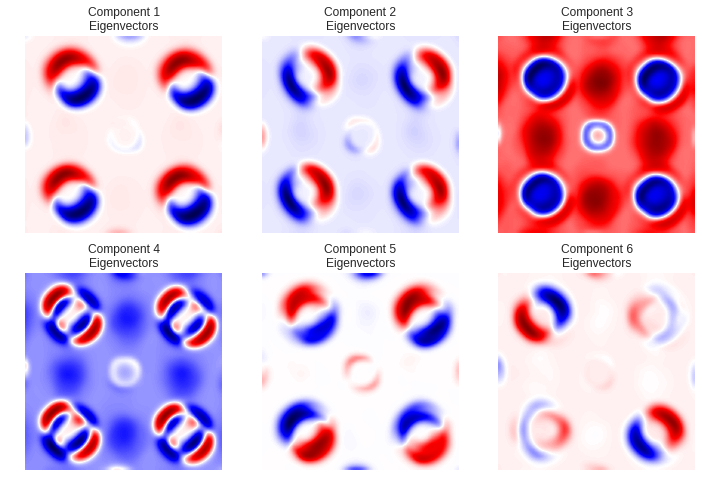

NUMBER OF COMPONENTS: 7


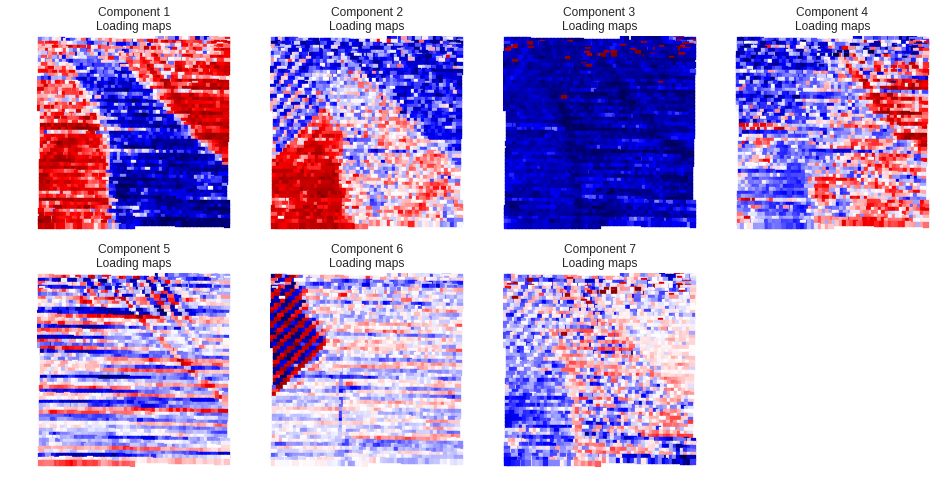

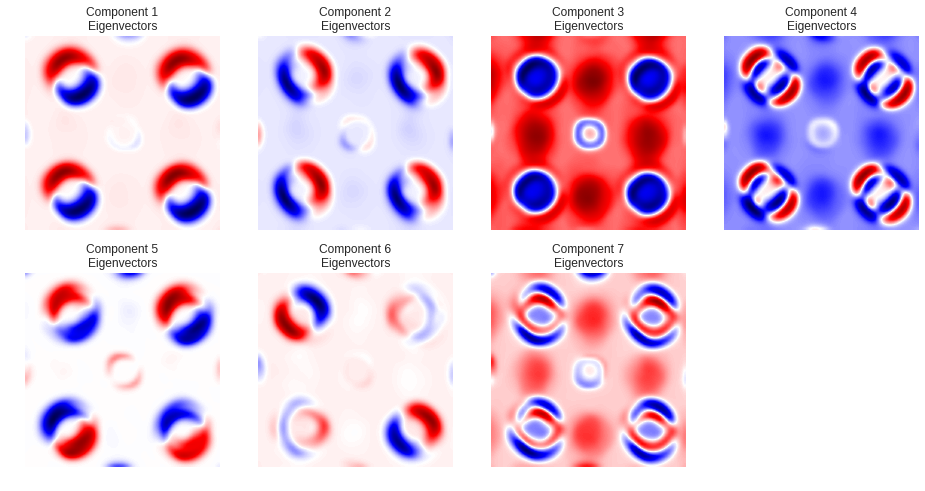

NUMBER OF COMPONENTS: 8


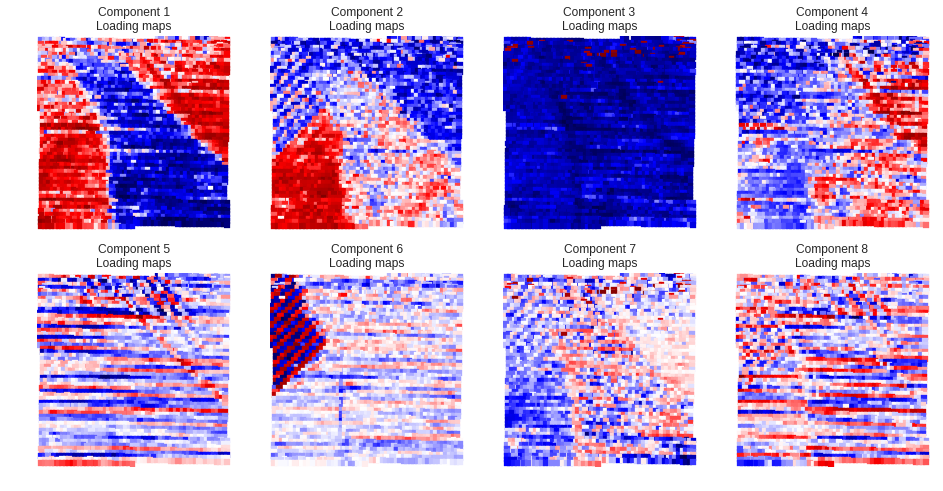

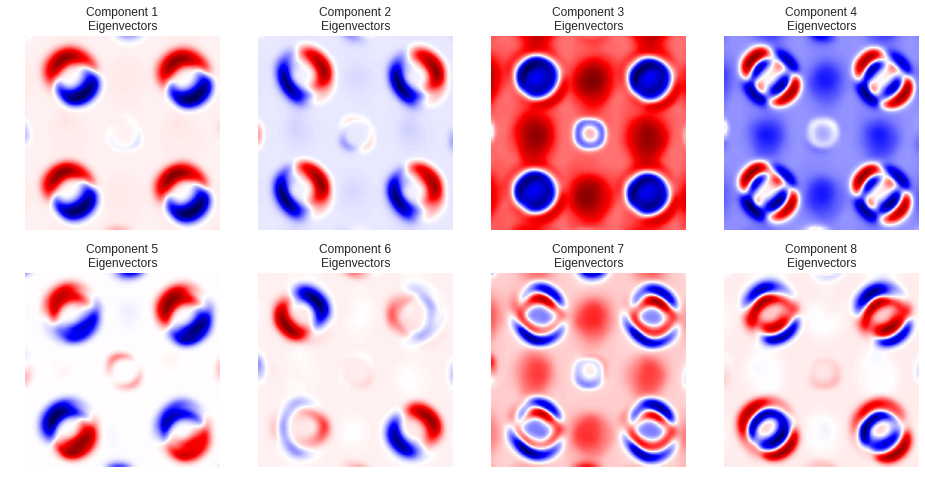

NUMBER OF COMPONENTS: 9


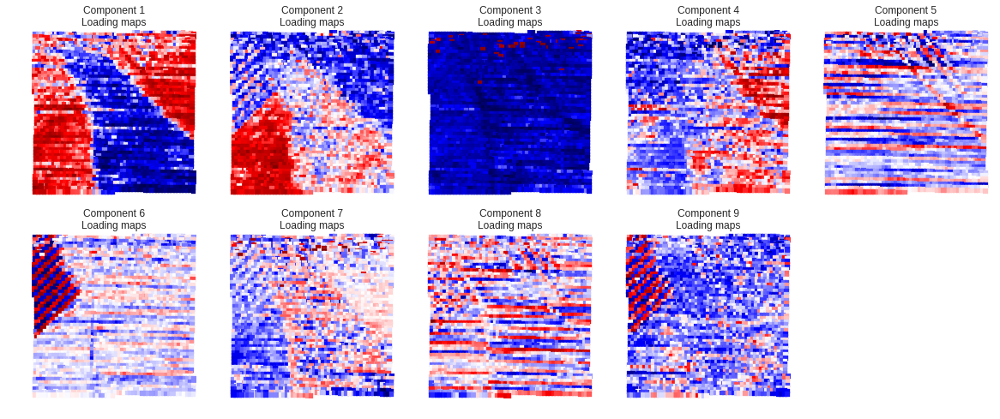

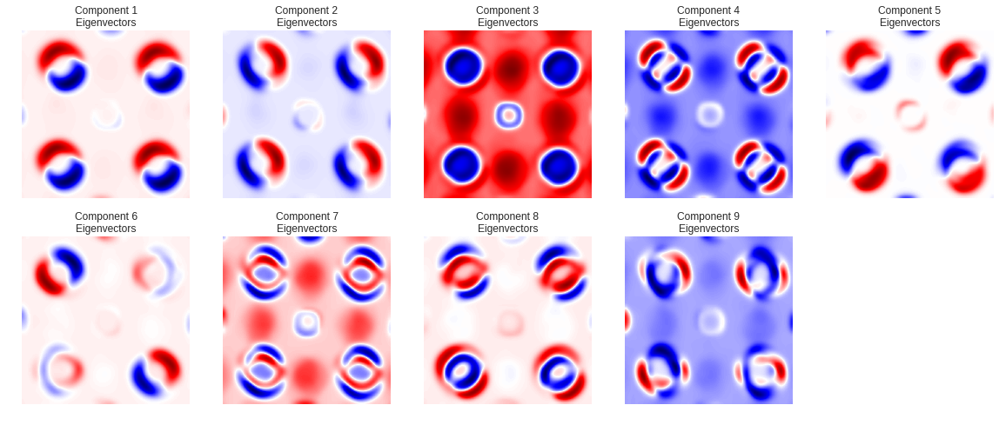

NUMBER OF COMPONENTS: 10


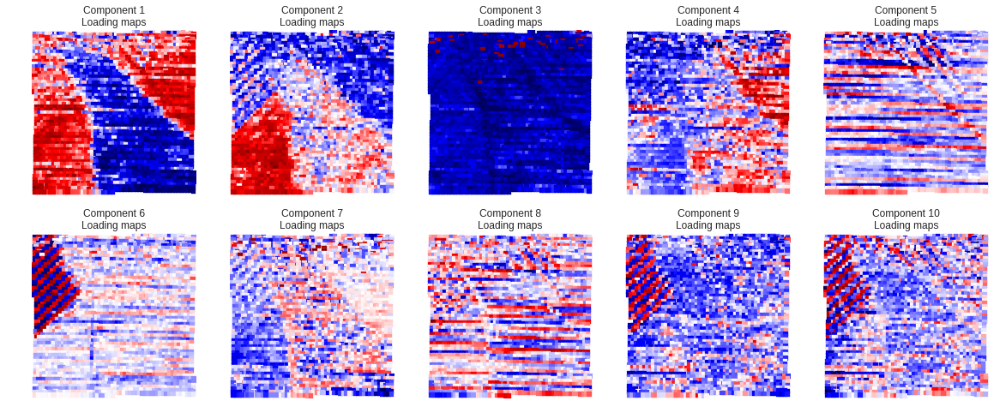

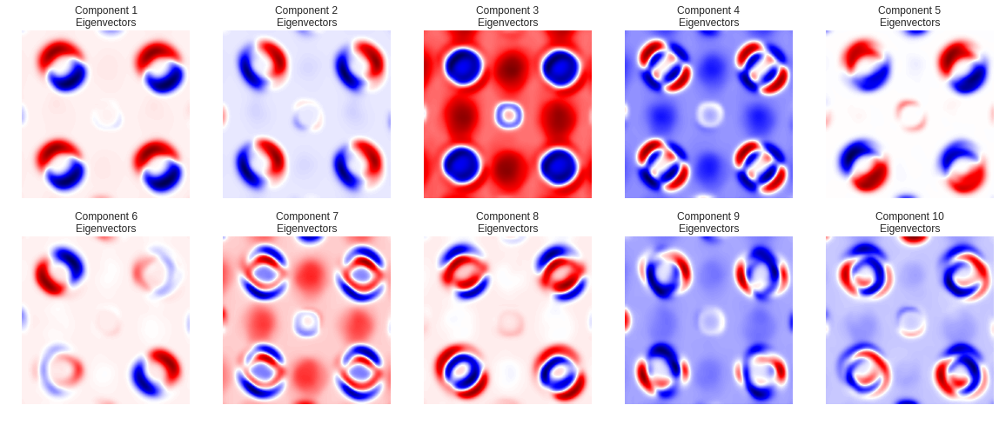

In [0]:
components_total = [3, 4, 5, 6, 7, 8, 9, 10]
for nc in components_total:
    pca = decomposition.PCA(n_components = nc, random_state = 42)
    X_vec_t = pca.fit_transform(X_vec)
    components = pca.components_
    components = components.reshape(nc, w, h, ch)
    rows = int(np.ceil(float(nc)/5))
    cols = int(np.ceil(float(nc)/rows))
    y, x = com_.T
    print('NUMBER OF COMPONENTS: ' + str(nc))
    gs1 = gridspec.GridSpec(rows, cols)
    fig1 = plt.figure(figsize = (4*cols, 4*(1+rows//2)))   
    for i in range(nc):
        ax1 = fig1.add_subplot(gs1[i])
        ax1.scatter(x, y, c = X_vec_t[:,i], cmap= 'seismic', marker = 's', s = 32)
        ax1.set_xlim(0, 2048)
        ax1.set_ylim(2048, 0)
        ax1.set_aspect('equal')
        ax1.axis('off')
        ax1.set_title('Component ' + str(i + 1) + '\nLoading maps')
    fig1.savefig(mdirectory+str(image_filename[0:-4])+'-PCAmaps-n_cells-'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()    
    gs2 = gridspec.GridSpec(rows, cols)
    fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//2)))   
    for i in range(nc):
        ax2 = fig2.add_subplot(gs2[i])
        ax2.imshow(components[i,:,:,0]+components[i,:,:,1],
                   cmap = 'seismic', Interpolation = 'Gaussian')
        ax2.set_aspect('equal')
        ax2.axis('off')
        ax2.set_title('Component ' + str(i + 1) + '\nEigenvectors')
    fig2.savefig(mdirectory+str(image_filename[0:-4])+'-PCAmodes-n_cells'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

We can use information from PCA "scree plot" to estimate number of components in the Gaussian mixture analysis. Then we do unmxing and plot spatial distribution of different clusters. We will show results of unmixing into different number of components* (from 4 to 10 based on the "scree plot" above):

*note to self: it is better when the color schemes match across different unmxixing results (e.g. make it dependent on the size of a cluster)

In [0]:
colors = ['blue', 'green', 'red', 'magenta', 'cyan', 'yellow', 'black', 'darkviolet',  'darkorange', 'gold', 'pink']

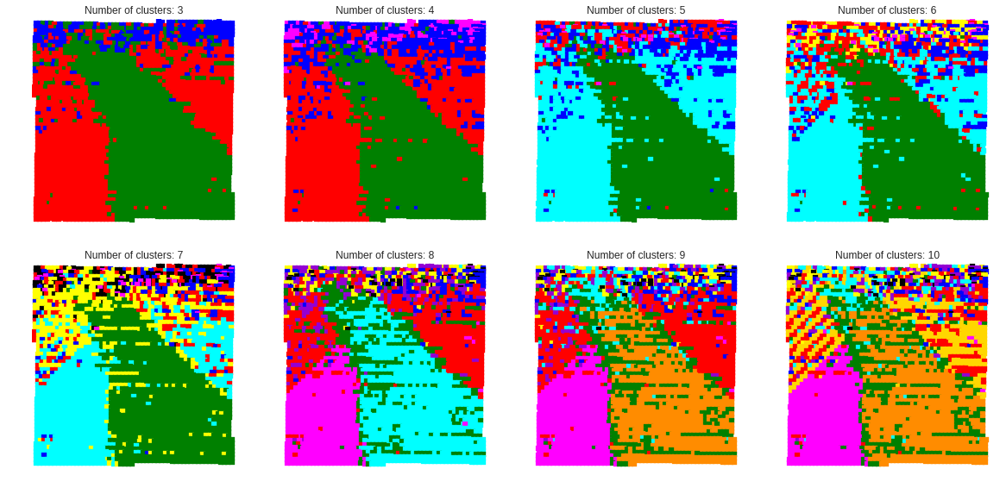

In [0]:
clusters = [3, 4, 5, 6, 7, 8, 9, 10]
rows = 4
cols = 4
gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (20, 20))   
for idx, i in enumerate(clusters):
    ax = fig.add_subplot(gs[idx])
    clf = mixture.GaussianMixture(
        n_components=i, covariance_type='diag', random_state = 42).fit(X_vec)
    labels = clf.predict(X_vec)
    for k in range(com_.shape[0]):
        ax.scatter(com_[k][1], com_[k][0], c = colors[labels[k]], marker = 's', s = 32)
    ax.set_xlim(0, 2048)
    ax.set_ylim(2048, 0)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title('Number of clusters: ' + str(i))
fig.savefig(mdirectory+str(image_filename[0:-4])+'-GMM-maps-n_cells-'+str(sc)+'.png')

Run the independent component analysis (ICA) on the same set of data and display eigenvectors with the associated laoding maps:

NUMBER OF COMPONENTS: 3


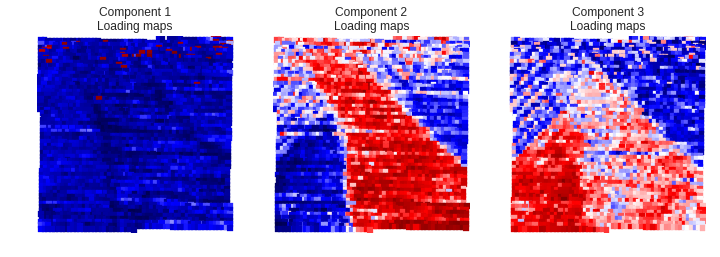

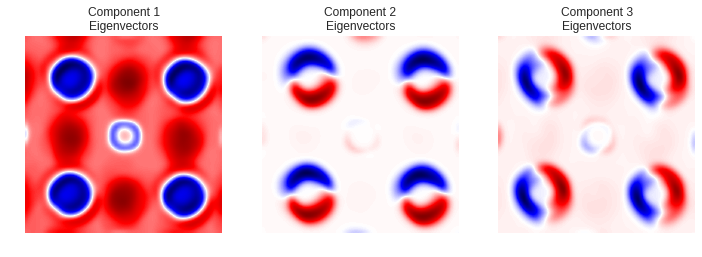

NUMBER OF COMPONENTS: 4


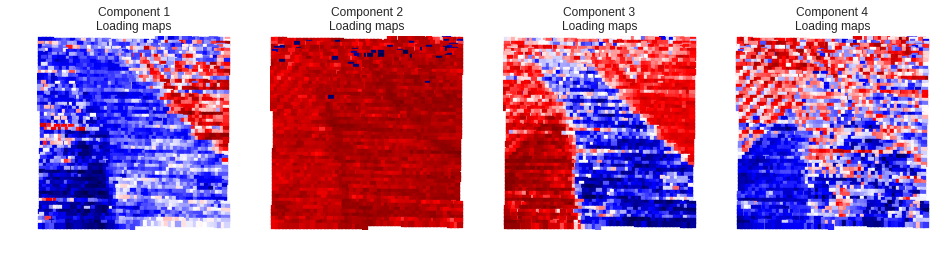

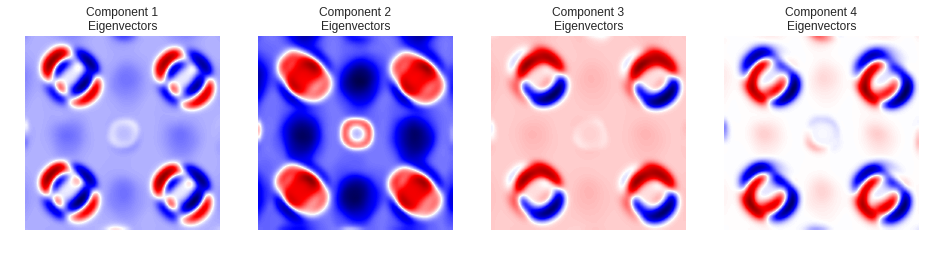

NUMBER OF COMPONENTS: 5


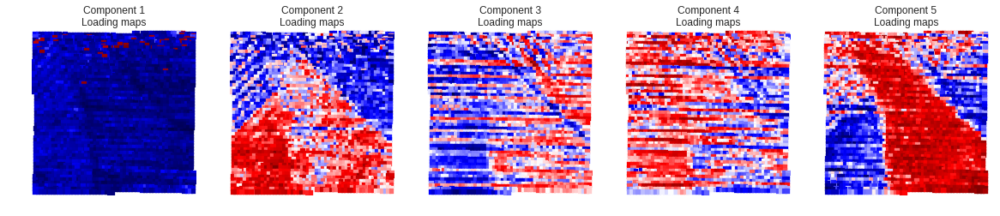

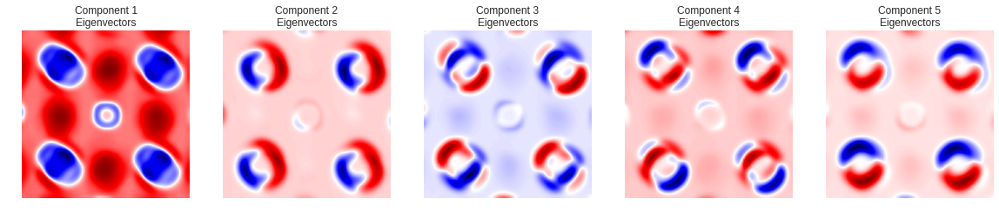

NUMBER OF COMPONENTS: 6


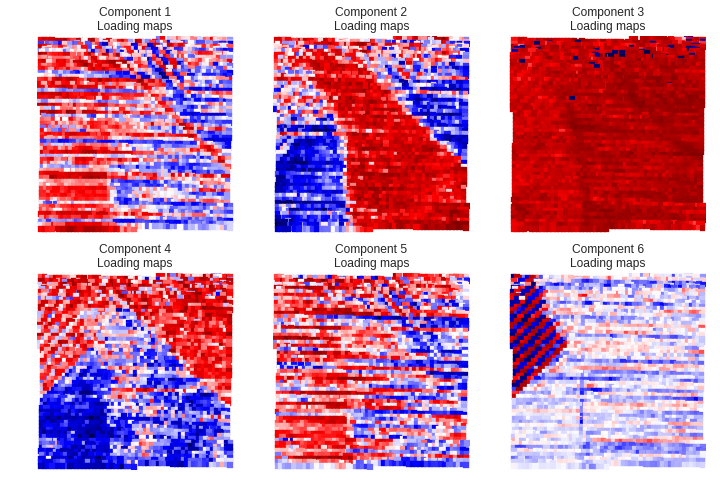

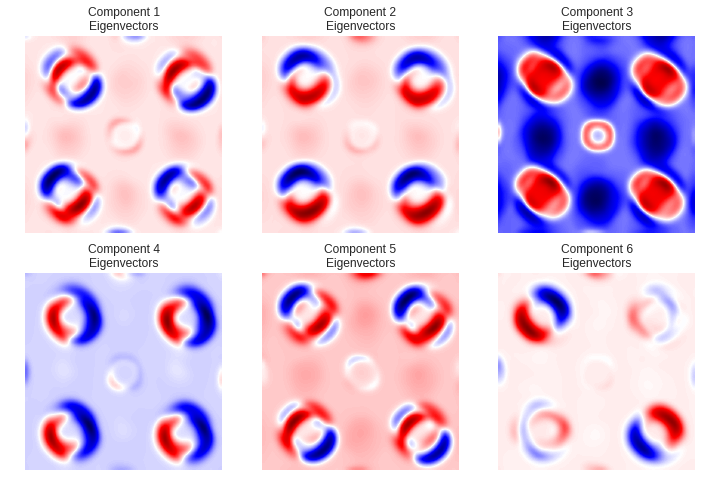

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


NUMBER OF COMPONENTS: 7


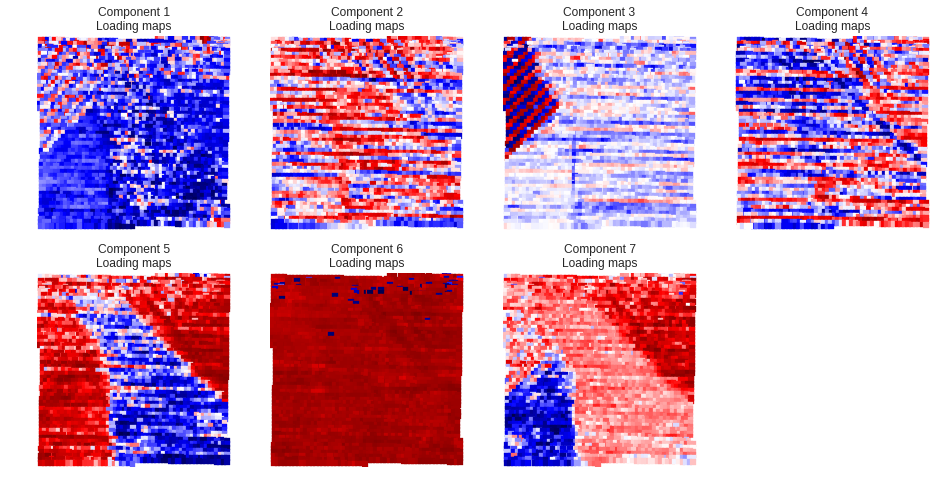

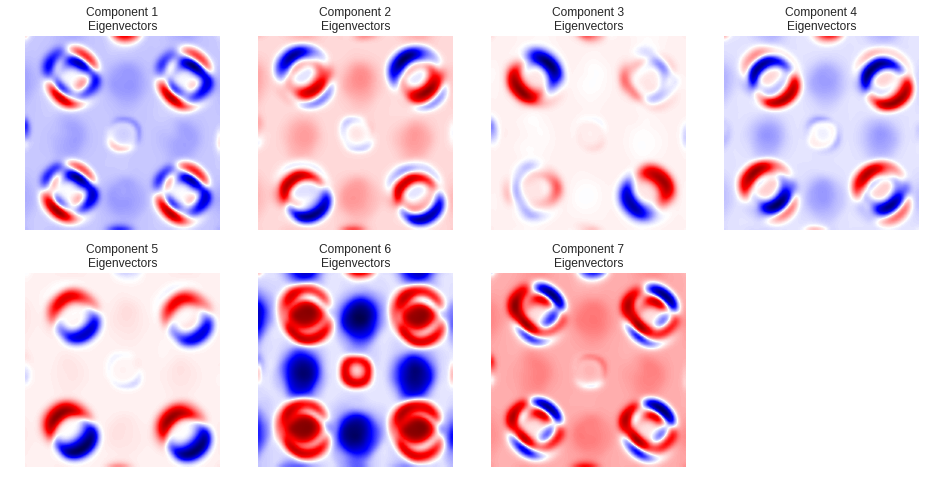

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


NUMBER OF COMPONENTS: 8


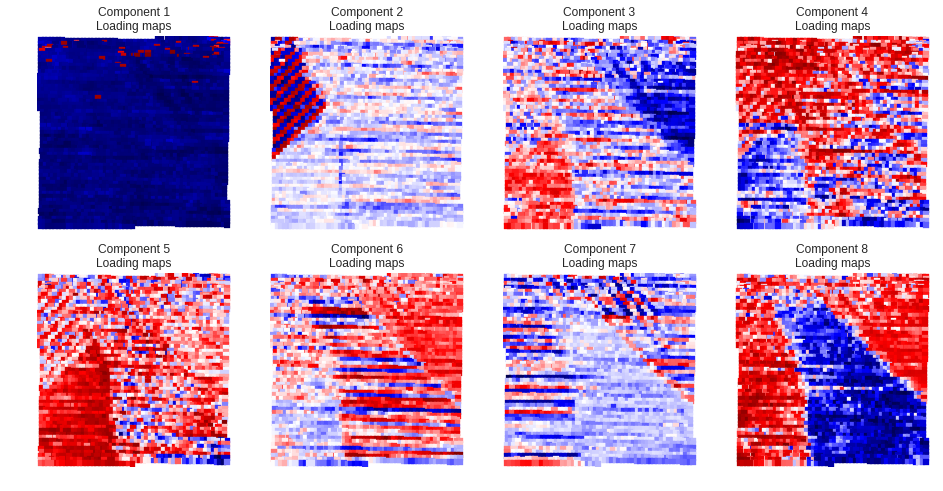

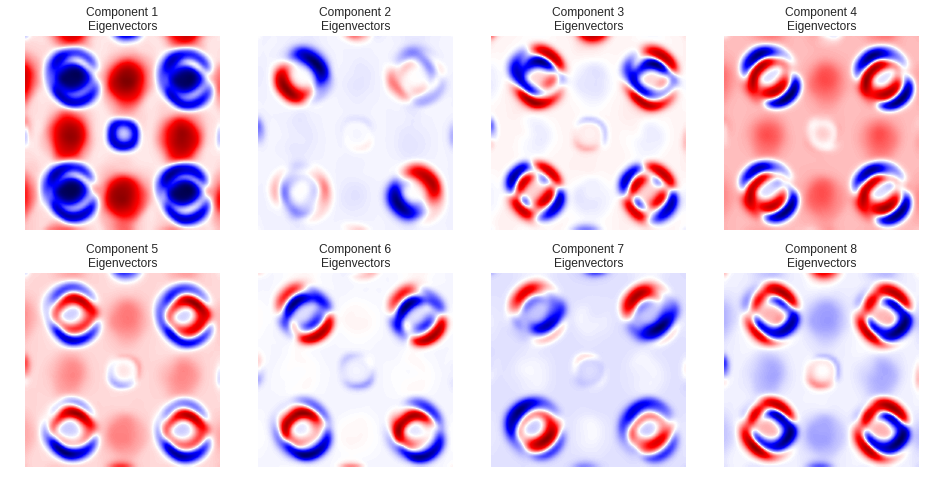

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


NUMBER OF COMPONENTS: 9


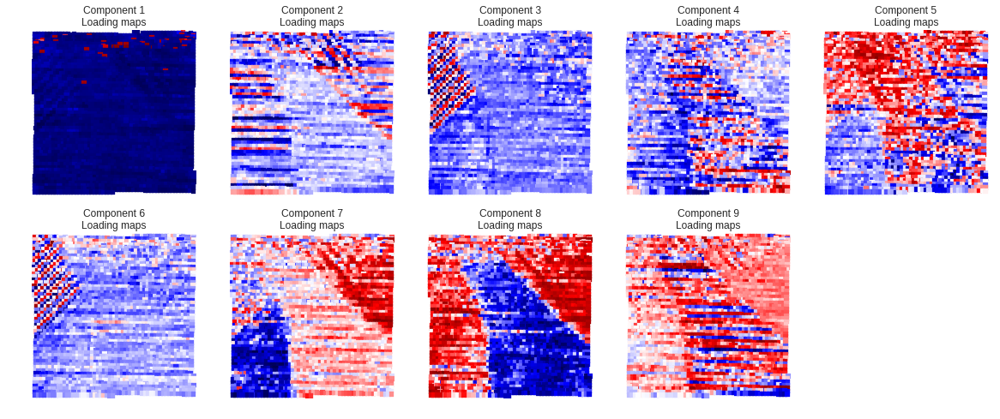

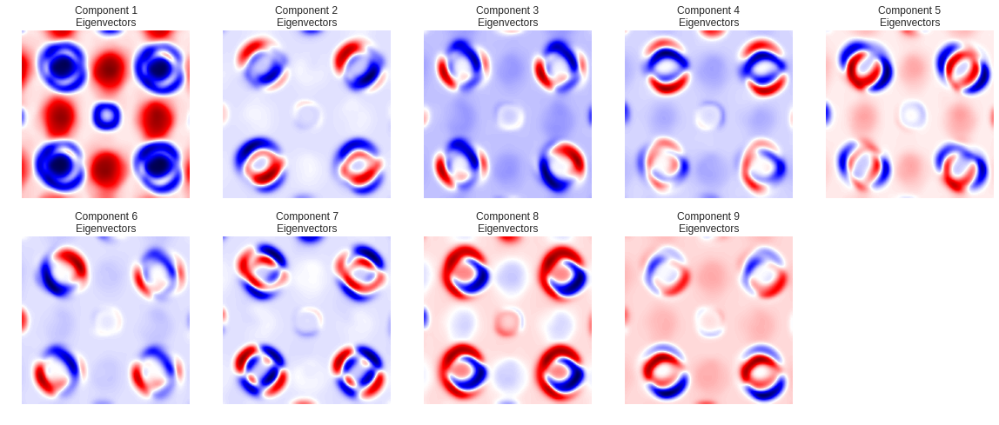

/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/fastica_.py:121: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


NUMBER OF COMPONENTS: 10


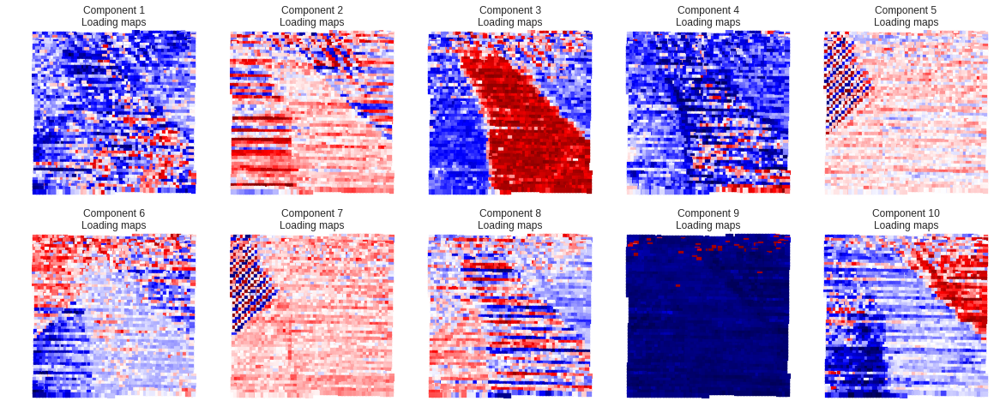

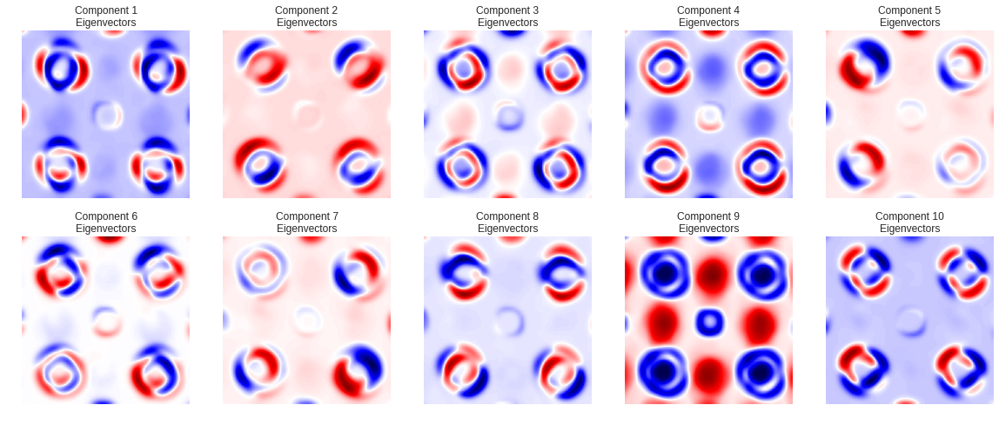

In [0]:
components_total = [3, 4, 5, 6, 7, 8, 9, 10]
for nc in components_total:
    ica = decomposition.FastICA(n_components = nc, random_state = 42, max_iter = 1000)
    X_vec_t = ica.fit_transform(X_vec)
    components = ica.components_
    components = components.reshape(nc, w, h, ch)
    rows = int(np.ceil(float(nc)/5))
    cols = int(np.ceil(float(nc)/rows))
    y, x = com_.T
    print('NUMBER OF COMPONENTS: ' + str(nc))
    gs1 = gridspec.GridSpec(rows, cols)
    fig1 = plt.figure(figsize = (4*cols, 4*(1+rows//2)))   
    for i in range(nc):
        ax1 = fig1.add_subplot(gs1[i])
        ax1.scatter(x, y, c = X_vec_t[:,i], cmap= 'seismic', marker = 's', s = 32)
        ax1.set_xlim(0, 2048)
        ax1.set_ylim(2048, 0)
        ax1.set_aspect('equal')
        ax1.axis('off')
        ax1.set_title('Component ' + str(i + 1) + '\nLoading maps')
    fig1.savefig(mdirectory+str(image_filename[0:-4])+'-ICAmaps-n_cells-'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()    
    gs2 = gridspec.GridSpec(rows, cols)
    fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//2)))   
    for i in range(nc):
        ax2 = fig2.add_subplot(gs2[i])
        ax2.imshow(components[i,:,:,0]+components[i,:,:,1],
                   cmap = 'seismic', Interpolation = 'Gaussian')
        ax2.set_aspect('equal')
        ax2.axis('off')
        ax2.set_title('Component ' + str(i + 1) + '\nEigenvectors')
    fig2.savefig(mdirectory+str(image_filename[0:-4])+'-ICAmodes-n_cells'
                 +str(sc)+'-n_components'+str(nc)+'.png')
    plt.show()

# Conclusions

TBA

### Download the output (code)

Finally, download the output of this analysis to a local machine:

In [0]:
!zip -r output.zip $mdirectory
files.download('output.zip')

  adding: Figures/ (stored 0%)
  adding: Figures/22.06.02_2-PCAmaps-n_cells-1-n_components4.png (deflated 1%)
  adding: Figures/22.06.02_2-PCAmodes-n_cells1-n_components5.png (deflated 1%)
  adding: Figures/22.06.02_2-PCAmaps-n_cells-1-n_components6.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmaps-n_cells-1-n_components5.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmaps-n_cells-1-n_components9.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmodes-n_cells1-n_components8.png (deflated 1%)
  adding: Figures/22.06.02_2-PCA-scree-n_cells-1.png (deflated 12%)
  adding: Figures/22.06.02_2-ICAmodes-n_cells1-n_components5.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmaps-n_cells-1-n_components8.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmodes-n_cells1-n_components3.png (deflated 1%)
  adding: Figures/22.06.02_2-GMM-maps-n_cells-1.png (deflated 7%)
  adding: Figures/22.06.02_2-PCAmaps-n_cells-1-n_components8.png (deflated 1%)
  adding: Figures/22.06.02_2-ICAmodes-n_cells